In [2]:
import os
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt 
import seaborn as sns 
import anndata
import PyComplexHeatmap 
from PyComplexHeatmap import *
from PIL import Image
import squidpy as sq
import cv2 
from collections import Counter
from scipy.ndimage import label
import anndata as ad
import scanpy.external as sce
%matplotlib inline
from collections import Counter
from scipy.cluster.hierarchy import dendrogram, fcluster
from lifelines.plotting import add_at_risk_counts
import math
import pickle
import scipy.stats as stats
import scipy
import scanpy.external as sce
from lifelines.statistics import logrank_test
import random
from scipy.sparse import csr_matrix
from matplotlib_venn import venn2
from lifelines import KaplanMeierFitter
from sklearn.neighbors import KernelDensity
from collections import Counter, OrderedDict
from scipy.sparse import csr_matrix
import infercnvpy as cnv
import warnings
from scipy.stats import pearsonr
from matplotlib.path import Path
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from scipy.spatial import distance
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter
import cv2
warnings.filterwarnings("ignore")

kernel_dilation = np.array([[0, 1, 0],
                   [1, 1, 1],
                   [0, 1, 0]], np.uint8)
def normalize_list(values):
    min_val = min(values)
    max_val = max(values)
    normalized_values = [(value - min_val) / (max_val - min_val) for value in values]
    return normalized_values
def remove_small_objects(density_red_bi, thr,replace):
    # Detect connected components
    labeled_mask, num_features = label(density_red_bi)
    # Get the sizes of the components
    component_sizes = np.bincount(labeled_mask.ravel())
    # Create a mask that filters out components smaller than 5 pixels
    filtered_mask = np.zeros_like(labeled_mask)

    # Loop through each component and keep only those larger than or equal to 5 pixels
    for i, size in enumerate(component_sizes):
        if size >= thr and i>0:
            filtered_mask[labeled_mask == i] = replace
    return filtered_mask

## load the data
path='/path_to_visium_data'
adata_=sc.read_h5ad(f'{path}/30_scnorm_nofilter_genes.h5ad')
adata_.obs['library_id']=adata_.obs['Sample']

# Load the gene modules
gene_list = pd.read_csv('/path_to_genelist_data')
gene_list.columns = gene_list.iloc[0]
gene_list = gene_list.drop(gene_list.index[0])

## '7003_4','7003_3' are 2 outlier samples, with very high mrCAF compared with the rest samples
## '7319_2', '8899_7' are 2 samples that have multiple separate tissue regions on the slide
remove=['7003_4','7003_3','7319_2', '8899_7']
adata_=adata_[~adata_.obs.library_id.isin(remove)]
library_all = adata_.obs['library_id'].unique().tolist()
len(library_all)

26

In [3]:
# Score genes
for t in gene_list.columns:
    print(len(gene_list[t].dropna()))
    sc.tl.score_genes(adata_, gene_list[t].dropna(), score_name=t)

127
35
110
112
20
30
127
       'NFASC'],
      dtype='object')
109
45
17
8
3
6
13
5
96
16
66
13


Text(0, 0.5, 'mrCAF')

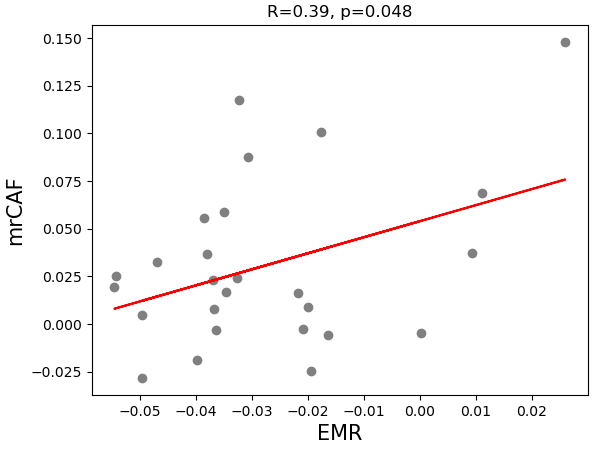

In [4]:
choose1='EMR'
choose2='mrCAF'
# Set thresholds f or EMR and mrCAF based on the 30th percentile to filter out noise 
# This focuses the analysis on more true signals. Higher thresholds (e.g., 50th, 70th percentile) will emphasize more significant correlations between mrCAF and EMR.
thr_emr = np.percentile(adata_.obs[choose1], 30)
thr_mr = np.percentile(adata_.obs[choose2], 30)
df1 = adata_.obs[adata_.obs[choose1] > thr_emr][['library_id', choose1]].reset_index(drop=True)
df2 = adata_.obs[adata_.obs[choose2] > thr_mr][['library_id', choose2]].reset_index(drop=True)

# Compute the mean values for each 'library_id' and sort them
mean_values1 = df1.groupby('library_id').mean().sort_values('library_id').reset_index()
mean_values2 = df2.groupby('library_id').mean().sort_values('library_id').reset_index()
mean_values1[choose2] = mean_values2[choose2]
mean_values_all = mean_values1.dropna()


# Calculate Pearson correlation
corr, p_value = pearsonr(mean_values_all[choose1], mean_values_all[choose2])

plt.scatter(mean_values_all[choose1], mean_values_all[choose2], color='grey', marker='o')
# for idx, library_id in enumerate(mean_values_all['library_id']):
#     label = '_'.join(library_id.split('_')[:2])
#     plt.annotate(label, (mean_values_all[choose1].iloc[idx], mean_values_all[choose2].iloc[idx]))
slope, intercept = np.polyfit(mean_values_all[choose1], mean_values_all[choose2], 1)
plt.plot(mean_values_all[choose1], slope * mean_values_all[choose1] + intercept, color='red')
plt.title(f'R={round(corr, 2)}, p={p_value:.2}')
plt.xlabel(choose1, fontsize=15)
plt.ylabel(choose2, fontsize=15)

In [5]:
## Normalize EMR and mrCAF to a 0-1 range, sort the samples based on (EMR * mrCAF)
mean_values_tent=mean_values_all.copy()
mean_values_tent['EMR_norm']=normalize_list(mean_values_tent[choose1])
mean_values_tent['mrCAF_norm']=normalize_list(mean_values_tent[choose2])
mean_values_tent['sort']=mean_values_tent['EMR_norm']*mean_values_tent['mrCAF_norm']

## calculate std of EMR nad mrCAF
std_emr = []
std_caf = []
for library in library_all:
    adata = adata_[adata_.obs.library_id == library].copy()
    std_emr.append(np.std(adata.obs['EMR']))
    std_caf.append(np.std(adata.obs['mrCAF']))

In [6]:
# Sort libraries by EMR standard deviation and get the sorted order
std_all = pd.DataFrame({
    'id': library_all,
    'std_emr': std_emr,
    'std_caf': std_caf
})
sorted_df = std_all[['id', 'std_emr']].sort_values(by='std_emr', ascending=False)
library_order = sorted_df['id'].tolist()

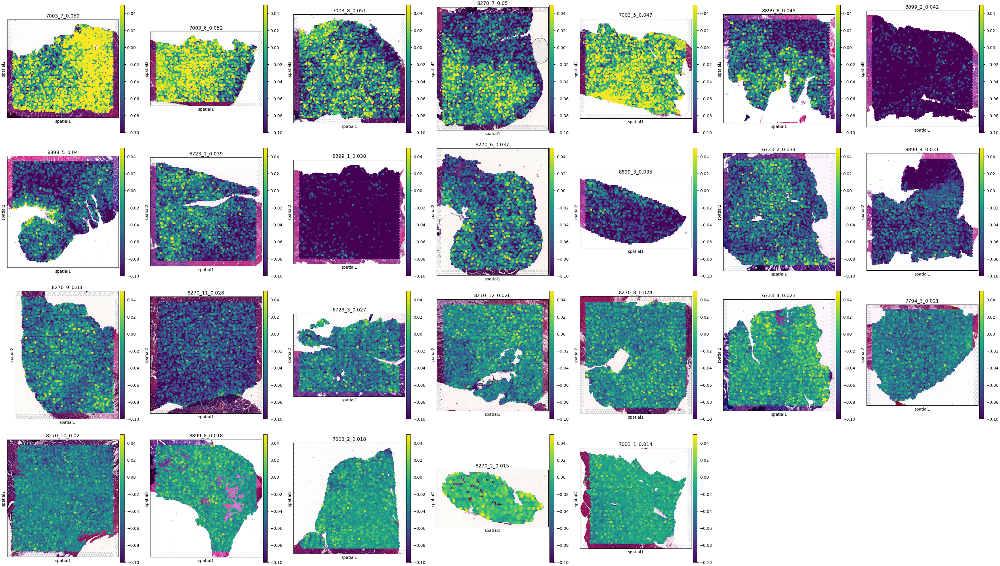

In [7]:
# plotting EMR spatial map sorted by localized EMR score
n_cols = 7
n_libraries = len(library_order)
n_rows = math.ceil(n_libraries / n_cols)  
fig, axes = plt.subplots(n_rows, n_cols, figsize=(5 * n_cols, 5 * n_rows))  
axes = axes.flatten()  

for i, library in enumerate(library_order):
    adata = adata_[adata_.obs.library_id == library].copy()
    library2 = [i for i in list(adata.uns['spatial'].keys()) if i.split('_')[0]==library.split('_')[0] and i.split('_')[1]==library.split('_')[1]][0]
    adata.uns['spatial'] = {library2: adata.uns['spatial'][library2][list(adata.uns['spatial'][library2].keys())[0]]}
    std_scrore = round(sorted_df.loc[sorted_df.id == library, 'std_emr'].values[0], 3)
    sc.pl.spatial(adata, title=f'{library}_{std_scrore}', img_key="hires", color=['EMR'], ax=axes[i], show=False,vmax=0.05,vmin=-0.1, size=2)
for ax in axes[len(library_order):]:
    ax.axis('off')  
plt.tight_layout()

In [8]:
## select samples with localized EMR structure and high (EMR * mrCAF) score
library_local=list(sorted_df[sorted_df.std_emr>np.percentile(sorted_df.std_emr, 60)].id)
library_uniform=library_order[:]
library_pick2=list(mean_values_tent[mean_values_tent.sort>np.percentile(mean_values_tent.sort, 60)].library_id)
localized_EMR=[i for i in library_pick2 if i in library_local]
arr_tent=mean_values_tent[mean_values_tent.library_id.isin(localized_EMR)].copy() 
localized_EMR=list(arr_tent.sort_values(by='sort',ascending=False).library_id)

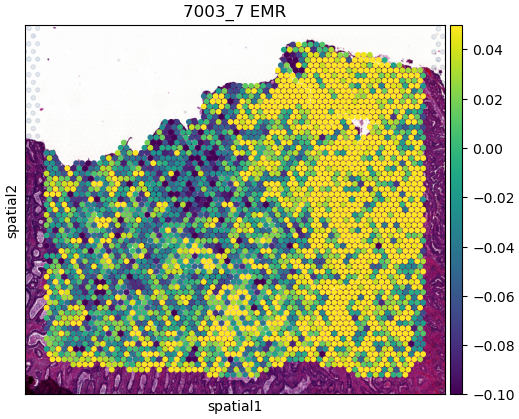

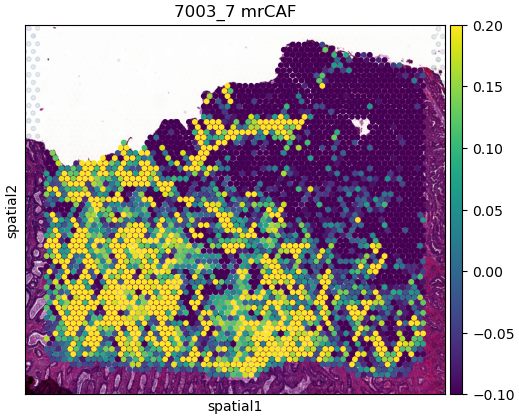

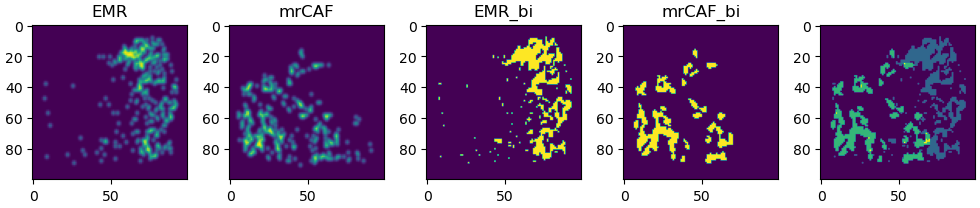

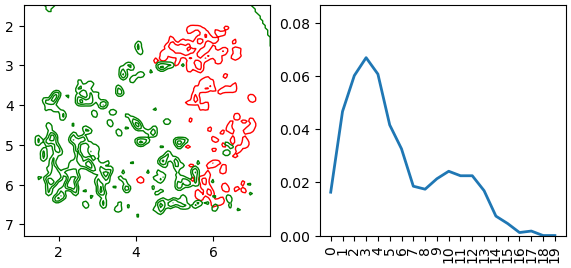

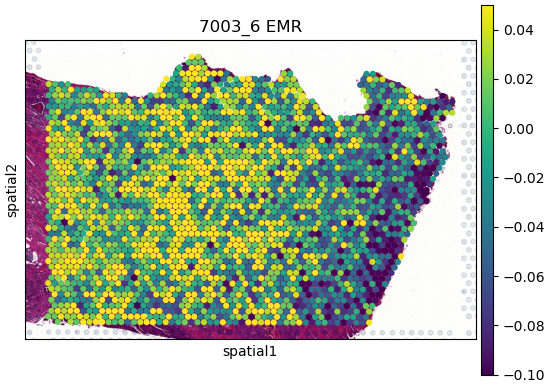

...

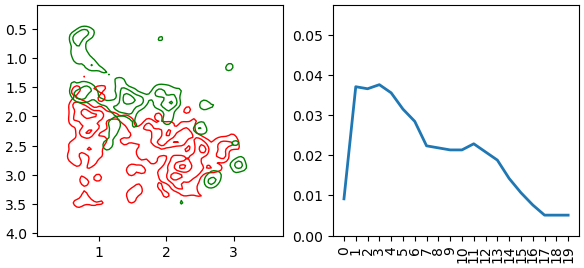

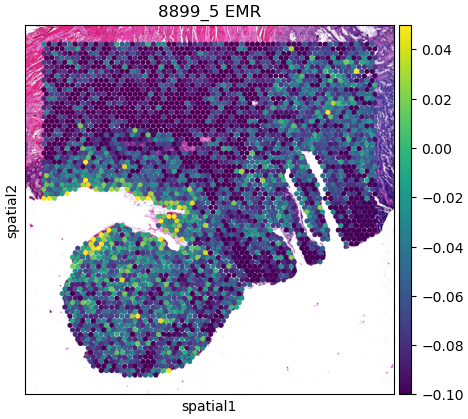

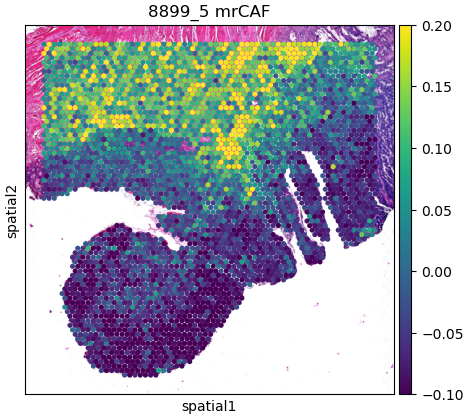

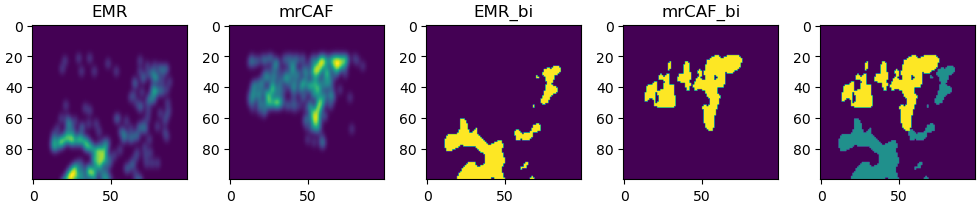

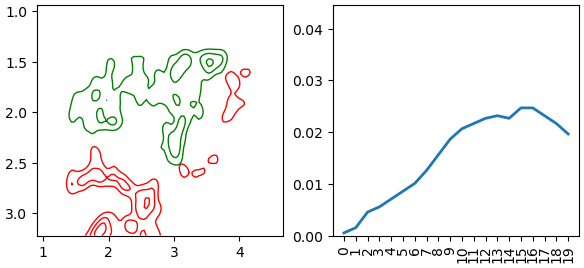

In [9]:
thr_emr, thr_mrcaf = 90, 90
thr_emr2, thr_mrcaf2 = 90, 90
dilation_limit = 20
thr_custom=[]

centroid_distance=[]
centroid_distance_norm=[]
peak = []
min_distance=[]

IoU_all = []
lib_all = []

for tent, library in enumerate(localized_EMR):
    adata = adata_[adata_.obs.library_id == library].copy()
    library2 = next(i for i in adata.uns['spatial'] if i.startswith(library.split('_')[0] + '_' + library.split('_')[1]))
    adata.uns['spatial'] = {library2: adata.uns['spatial'][library2][list(adata.uns['spatial'][library2].keys())[0]]}
    sc.pl.spatial(adata, img_key="hires", title=[f'{library} EMR'], color=[choose1], ncols=2,vmax=0.05,vmin=-0.1, size=1.5, show=False)
    sc.pl.spatial(adata, img_key="hires", title=[f'{library} mrCAF'], color=[choose2], ncols=2,vmax=0.2,vmin=-0.1, size=1.5, show=False)

    coor1 = adata[adata.obs[choose1] > np.percentile(adata.obs[choose1].astype(float), thr_emr)].obsm['spatial']
    coor2 = adata[adata.obs[choose2].astype(float) > np.percentile(adata.obs[choose2].astype(float), thr_mrcaf)].obsm['spatial']

    if len(coor1) > 0 and len(coor2) > 0:
        kde_red = KernelDensity(bandwidth=0.06, kernel='gaussian').fit(coor1 / 1000)
        kde_green = KernelDensity(bandwidth=0.06, kernel='gaussian').fit(coor2 / 1000)

        x_min, x_max = np.min(coor1[:, 0]) / 1000 - 0.5, np.max(coor2[:, 0]) / 1000 + 0.5
        y_min, y_max = np.min(coor1[:, 1]) / 1000 - 0.5, np.max(coor2[:, 1]) / 1000 + 0.5
        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        grid_points = np.c_[xx.ravel(), yy.ravel()]

        density_red = np.exp(kde_red.score_samples(grid_points)).reshape(xx.shape)
        density_green = np.exp(kde_green.score_samples(grid_points)).reshape(xx.shape)

        intersection_area = np.sum(np.minimum(density_red, density_green))
        union_area = np.sum(density_red) + np.sum(density_green) - intersection_area
        IoU = intersection_area / union_area
        IoU_all.append(IoU)
        lib_all.append(library)
        
        density_red_bi = np.where(density_red > np.percentile(density_red, thr_emr2), 1, 0).astype(np.uint8)
        density_green_bi = np.where(density_green > np.percentile(density_green, thr_mrcaf2), 2, 0)

        # density_red_bi=remove_small_objects(density_red_bi,5,1).astype(np.uint8)
        density_green_bi=remove_small_objects(density_green_bi,10,2).astype(np.uint8)
        

        meet_pix = []
        for ite in range(1, dilation_limit+1 , 1):
            density_red_dilated = cv2.dilate(density_red_bi, kernel_dilation, iterations=ite)
            meet_pix.append(Counter((density_red_dilated - density_red_bi + density_green_bi).flatten())[3])     
        differences = [Counter((density_red_bi + density_green_bi).flatten())[3]] +meet_pix
        differences=np.diff(differences).tolist()
        differences = np.array(differences) / np.sum(density_green_bi)
        peak.append(np.argmax(differences))

        red_mask=np.array(np.where(density_red_bi!=0)).T
        green_mask=np.array(np.where(density_green_bi!=0)).T
        centroid_red = np.mean(red_mask, axis=0)
        centroid_green = np.mean(green_mask, axis=0)
        
        scale_A = np.max(np.linalg.norm(red_mask - centroid_red, axis=1))
        scale_B = np.max(np.linalg.norm(green_mask - centroid_green, axis=1))
        
        points_A_norm = (red_mask - centroid_red) / scale_A
        points_B_norm = (green_mask - centroid_green) / scale_B
        
        centroid_distance_norm.append(np.linalg.norm(points_A_norm.mean(axis=0) - points_B_norm.mean(axis=0)))

        # Calculate Euclidean distance between centroids
        centroid_distance.append(np.linalg.norm(centroid_red - centroid_green))

        # Use cdist to compute the distance between each point in red and green contours
        distances = distance.cdist(red_mask, green_mask, 'euclidean')
        # Find the minimum distance
        min_distance.append(np.mean(distances))

         # Plot results
        plt.figure(figsize=(10, 3))
        plt.subplot(1, 5, 1), plt.title(choose1), plt.imshow(density_red)
        plt.subplot(1, 5, 2), plt.title(choose2), plt.imshow(density_green)
        plt.subplot(1, 5, 3), plt.title(f'{choose1}_bi'), plt.imshow(density_red_bi)
        plt.subplot(1, 5, 4), plt.title(f'{choose2}_bi'), plt.imshow(density_green_bi)
        plt.subplot(1, 5, 5), plt.imshow(density_red_bi + density_green_bi)
        
        plt.tight_layout()
        
        plt.figure(figsize=(7, 3))
        plt.subplot(1, 2, 1)
        plt.contour(xx, yy, density_red, colors='red', levels=3, linewidths=1, linestyles='solid', label=choose1)
        plt.contour(xx, yy, density_green, colors='green', levels=3, linewidths=1, linestyles='solid', label=choose2)
        plt.gca().invert_yaxis()
        plt.subplot(1, 2, 2)
        plt.plot(list(range(0, dilation_limit , 1)), differences, label=library, linewidth=2)
        plt.ylim(0, np.max(differences)+0.02)
        plt.xticks(range(0, dilation_limit , 1), rotation=90)



mean_values=mean_values_tent.copy()
mean_values=mean_values[~mean_values.library_id.isin(['7319_2', '8899_7'])].reset_index(drop=True)
df={'peak':centroid_distance,'IoU_all':IoU_all,'lib_all':lib_all}  ## centroid_distance ##centroid_distance_norm ## min_distance ## peak IoU_all

df=pd.DataFrame(df)

mean_values['EMR_norm']=normalize_list(mean_values[choose1])
mean_values['mrCAF_norm']=normalize_list(mean_values[choose2])

mean_values['IoU_all']='na'
mean_values['peak']='na'

for i in list(mean_values.library_id):
    if i in list(df.lib_all):
        mean_values.loc[mean_values.library_id==i,'IoU_all']=list(df.loc[df.lib_all==i,'IoU_all'])[0]
        mean_values.loc[mean_values.library_id==i,'peak']=list(df.loc[df.lib_all==i,'peak'])[0]
        
mean_values['sort']=mean_values['EMR_norm']+mean_values['mrCAF_norm']


# m_tent=mean_values[mean_values.peak!='na']
# print(pearsonr(m_tent['peak'], m_tent['sort']))
# print(pearsonr(m_tent['peak'], m_tent['EMR_norm']))
# print(pearsonr(mean_values['std_emr'], mean_values['sort']))

In [10]:
mean_values = mean_values.replace('na', np.nan)
std_all['id']=pd.Categorical(std_all['id'], categories=list(mean_values.library_id), ordered=True)
std_all = std_all.sort_values('id').reset_index(drop=True)

mean_values[['std_emr','std_caf']]=std_all[['std_emr','std_caf']]

df_mean_values_sorted=mean_values.sort_values(by='sort',ascending=True)

df_mean_values_sorted.peak=[np.nan if i=='na' else i for i in list(df_mean_values_sorted.peak) ]

In [11]:
## A correlation between the combined expression levels of EMR and mrCAF and the localized EMR structural score
print(pearsonr(mean_values['std_emr'], mean_values['sort']))

PearsonRResult(statistic=0.5725627854783767, pvalue=0.002237368821683929)


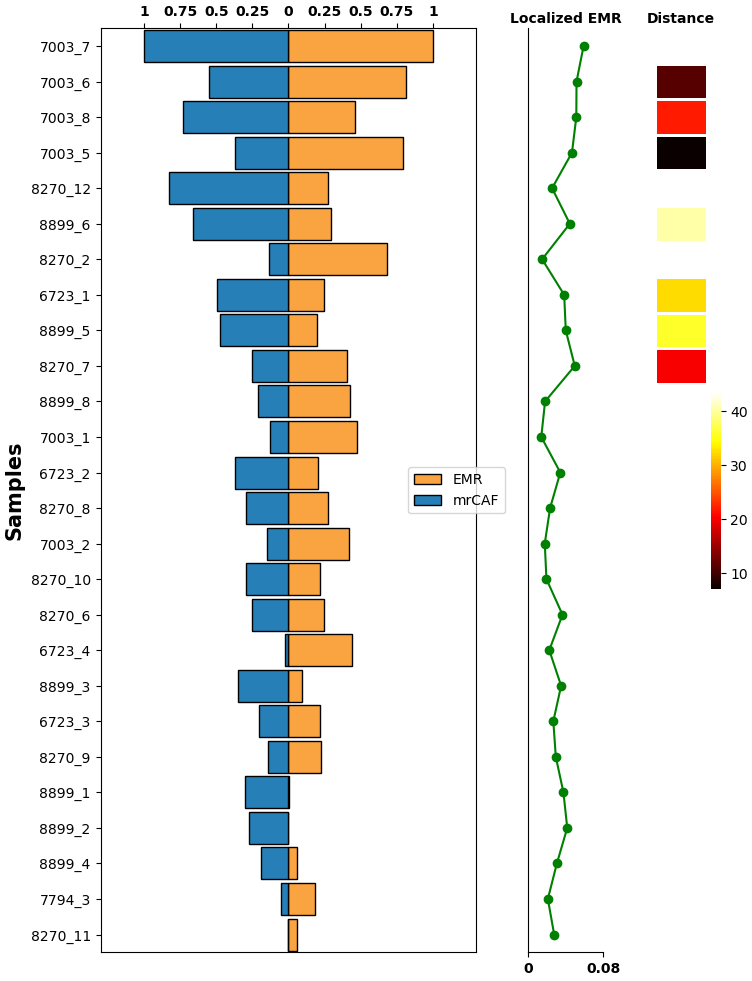

In [12]:

# Assuming df_mean_values_sorted is already defined with relevant data

fig = plt.figure(figsize=(8, 12))  # Adjusted the figure size
gs = fig.add_gridspec(1, 3, width_ratios=[4, 0.8,0.7], wspace=0.3)

# First axis: the bar plot
ax = fig.add_subplot(gs[0])

y = np.arange(len(df_mean_values_sorted))
width = 0.9  # the width of the bars

# Plot normalized EMR values on the right
ax.barh(y, df_mean_values_sorted['EMR_norm'], width, label='EMR', color='#f9a341', edgecolor='black')

# Plot normalized mrCAF values on the left (negative for alignment)
ax.barh(y, -df_mean_values_sorted['mrCAF_norm'], width, label='mrCAF', color='#277fb8', edgecolor='black')

# Add labels and formatting
ax.set_ylabel('Samples', fontsize=15, fontweight='bold')
ax.set_yticks(np.arange(len(df_mean_values_sorted)))  # Remove y-axis labels
ax.set_yticklabels(df_mean_values_sorted['library_id'])

# Move legend to the right
ax.legend(loc='center left', bbox_to_anchor=(0.8, 0.5))

# Adjust ticks on both axes and move x-ticks to the top
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')

# Set x-axis limits from 0 to 1 for both sides (right side positive, left side negative)
ax.set_xlim([-1.3, 1.3])
ax.set_ylim([-0.5, len(df_mean_values_sorted) - 0.5])  # Adjust y-limits to match the number of samples
ax.set_xticks([-1, -0.75, -0.5, -0.25, 0, 0.25, 0.5, 0.75, 1])
ax.set_xticklabels([1, 0.75, 0.5, 0.25, 0, 0.25, 0.5, 0.75, 1], fontweight='bold')

# Second axis: the heatmap, now aligned with the bar plot
ax2 = fig.add_subplot(gs[2])

# Create a heatmap of the 'peak' values, aligning it with the samples
sns.heatmap(df_mean_values_sorted['peak'][::-1].values.reshape(-1, 1).astype(float),
            ax=ax2, cbar=True, cmap='hot', yticklabels=False, fmt='', linewidths=2, annot=False, linecolor='white')

# Adjust heatmap to match bar plot's y-axis alignment and remove the white border
ax2.set_ylim(len(df_mean_values_sorted), 0)  # Adjust to match the sample alignment
ax2.set_xticks([])  # Remove x-ticks
ax2.set_yticks([])  # Remove y-ticks
ax2.set_xlabel('Distance', fontsize=10, fontweight='bold')
ax2.xaxis.set_label_position('top')

# Third axis: the line plot for 'std_emr'
ax3 = fig.add_subplot(gs[1])

# Create a line plot for the 'std_emr' values, aligning it with the samples
ax3.plot(df_mean_values_sorted['std_emr'].values, y, marker='o', color='green')

# Adjust line plot to match bar plot's y-axis alignment
ax3.set_ylim([-0.5, len(df_mean_values_sorted) - 0.5])  # Adjust to match the sample alignment
ax3.set_yticks([])  # Remove y-ticks
ax3.set_xlim([0, np.max(df_mean_values_sorted['std_emr']) + 0.02])
ax3.set_xlabel('Localized EMR', fontsize=10, fontweight='bold')
ax3.set_xticks([0, round(np.max(df_mean_values_sorted['std_emr']) + 0.02, 2)])
ax3.set_xticklabels([0, round(np.max(df_mean_values_sorted['std_emr']) + 0.02, 2)], fontweight='bold')
ax3.xaxis.set_label_position('top')
ax3.spines['right'].set_visible(False)
ax3.spines['top'].set_visible(False)

plt.tight_layout()

## Spatial overlap among CAFs

In [ ]:
## These steps take several hours
df_all=[]
df_all_var=[]
choose_type=list(gene_list.columns)
for g1 in choose_type:
    all_d=[]
    lib_all=[]
    for tent in range(len(library_all)): 
        
        library=library_all[tent]
        adata = adata_[adata_.obs.library_id == library].copy()
        IoU_all=[]
        lib_all0=[]
        for g2 in choose_type:             
            
            # g1='EMR'
            adata.obs[g1] = adata.obs[g1].astype(float)
            tent1=[i for i in list(adata.obs[g1]) if i!=0]
            coor1=adata[adata.obs[g1]>np.percentile(tent1, 92)].obsm['spatial']

            adata=adata[adata.obs[g2]!='nan']
            adata.obs[g2]=adata.obs[g2].astype(float)
            tent2=[i for i in list(adata.obs[g2]) if i!=0]
            if len(tent2)>0:
                coor2=adata[adata.obs[g2]>np.percentile(tent2, 92)].obsm['spatial']
                if len(coor1)>0 and len(coor2)>0:

                    red_points = coor1/10000  # Example red points
                    green_points = coor2/10000 # Example green points

                    kde_red = KernelDensity(bandwidth=0.06, kernel='gaussian').fit(red_points)
                    kde_green = KernelDensity(bandwidth=0.06, kernel='gaussian').fit(green_points)
                    # Generate grid of points for visualization
                    x_min, x_max = np.min(red_points[:, 0])-0.5, np.max(green_points[:, 0])+0.5
                    y_min, y_max = np.min(red_points[:, 1])-0.5, np.max(green_points[:, 1])+0.5
                    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
                    grid_points = np.c_[xx.ravel(), yy.ravel()]
                    # Calculate densities for grid points
                    density_red = np.exp(kde_red.score_samples(grid_points)).reshape(xx.shape)
                    density_green = np.exp(kde_green.score_samples(grid_points)).reshape(xx.shape)
                    # Calculate intersection area
                    intersection_area = np.sum(np.minimum(density_red, density_green))
                    # Calculate union area
                    union_area = np.sum(density_red) + np.sum(density_green) - intersection_area
                    # Calculate IoU
                    IoU = intersection_area / union_area

                    IoU_all.append(IoU)
                    lib_all0.append(library)


        all_d.append(IoU_all)
        lib_all.append(lib_all0)



    df=pd.DataFrame(all_d)
    df['library_id']=np.array(lib_all)[:,0]
    df.columns=choose_type+['library_id']
    df_all.append(list(df[choose_type].mean(axis=0)))
    df_all_var.append(list(df[choose_type].var(axis=0)))

In [ ]:
df_all2=pd.DataFrame(df_all)
df_all2.columns=choose_type
df_all2.index=choose_type

In [187]:
coor_list=['MF1', 'MF2', 'MF3', 'MF4', 'cCAF', 'dCAF', 'iCAF', 'mCAF', 'myCAF', 'vCAF']

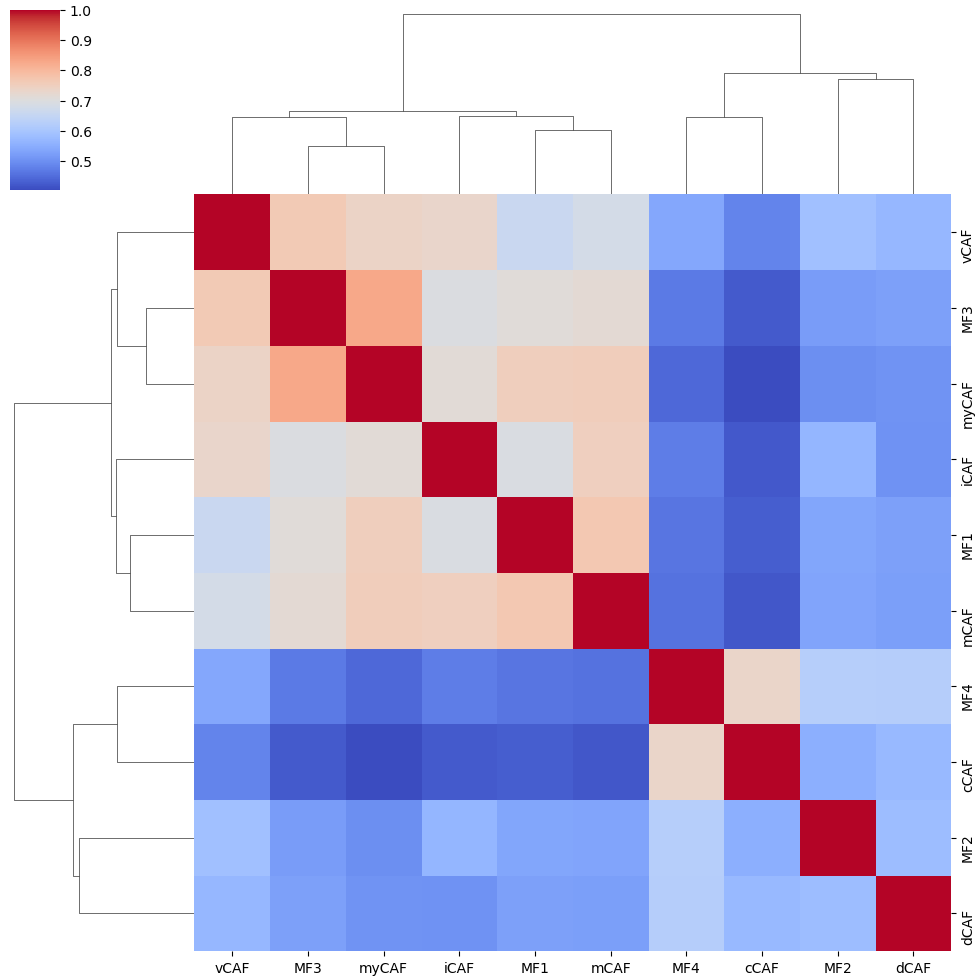

In [205]:
sns.clustermap(df_all2.loc[coor_list, coor_list],cmap='coolwarm')

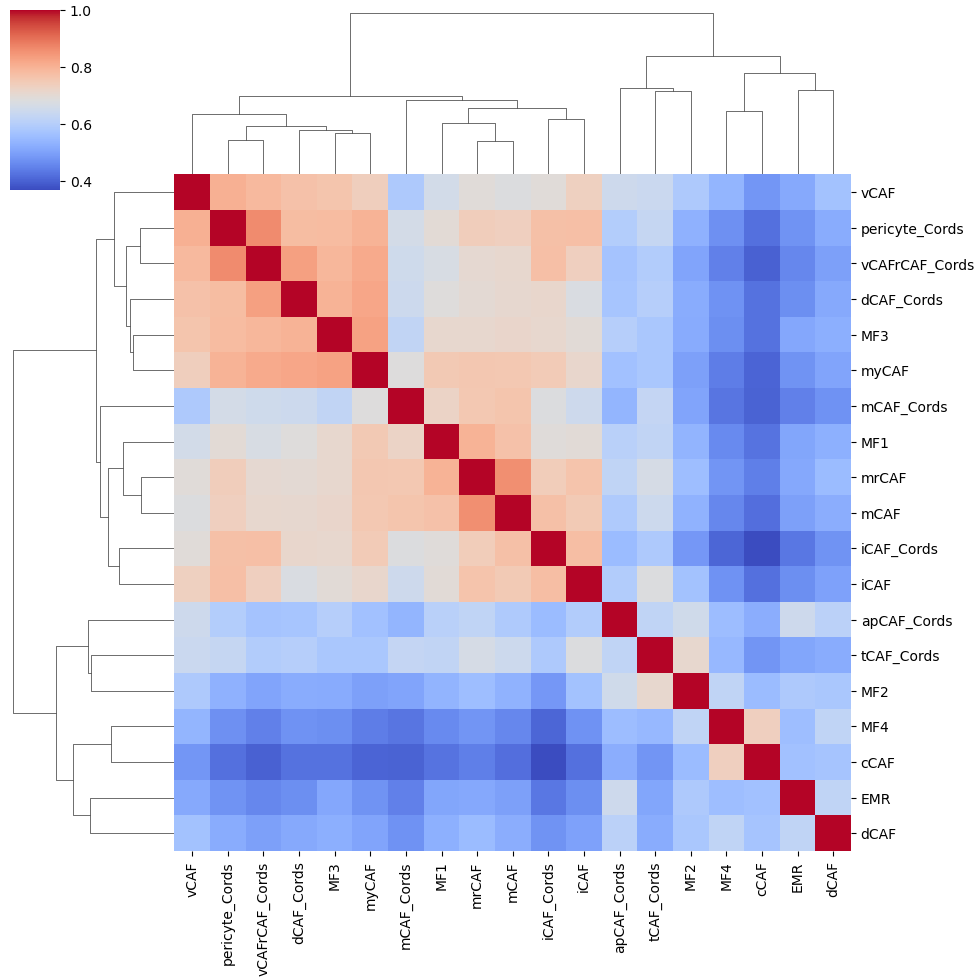

In [204]:
sns.clustermap(df_all2,cmap='coolwarm')